# VeloSafe

## Imports

In [195]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolor
import numpy as np

import folium
import matplotlib

import seaborn as sns

from math import isnan
from matplotlib import cm
import branca.colormap as colm

## Global variables

In [393]:
city = 'Nowy Targ'

roadtype_weights = {
    'cycleway': 1,
    'path': 1,
    'pedestrian': 2,
    'unclassified': 5,
    'residential': 400,
    'living_street': 400,
    'tertiary': 500,
    'secondary': 600,
    'primary': 700
}

ROADTYPE_WEIGHT = 1
MAXSPEED_WEIGHT = 1
LENGTH_WEIGHT = 1


## Importing street map data

In [289]:
class StreetData:
    @staticmethod
    def download(city, network_type='bike'):
        G_raw = ox.graph_from_place(city, network_type=network_type)
        G = ox.project_graph(G_raw)
        return G
    
    @staticmethod
    def consolidate_intersections(G):
        G = ox.consolidate_intersections(G, rebuild_graph=True, tolerance=10, dead_ends=False)
        nodes, edges = ox.graph_to_gdfs(G)
        G = ox.graph_from_gdfs(nodes, edges.explode('highway'))
        return G
    
    @staticmethod
    def fill_max_speed(G):
        # If no maxspeed available, set 50
        DEFAULT_SPEED = '50'
        # If many speeds available, get the biggest one
        def reduce_max_speed(x): 
            if isinstance(x, list):
                return str(max([int(speed) for speed in x]))
            else:
                return x
        
        nodes, edges = ox.graph_to_gdfs(G)

        edges['maxspeed'] = edges['maxspeed'].fillna(DEFAULT_SPEED).apply(reduce_max_speed)

        G = ox.graph_from_gdfs(nodes, edges)

        return G

    @staticmethod
    def save(G, filename):
        ox.save_graphml(G, './data/' + filename)

    @staticmethod
    def load(filename):
        return ox.load_graphml('./data/' + filename)
    
    @staticmethod
    def show(G):
        return ox.plot_graph(G)


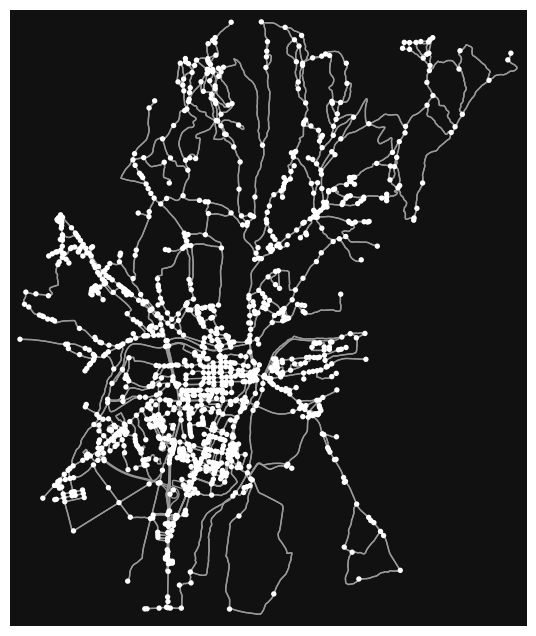

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [290]:
G = StreetData.download(city)
G = StreetData.consolidate_intersections(G)
G = StreetData.fill_max_speed(G)
StreetData.save(G, 'graph.graphml')
StreetData.show(G)

## Showing data on a map

In [404]:
class MapVisualizer:
    def __init__(self, city, **kwargs):
        self.map = folium.Map(location=ox.geocode(city), dragging=True, zoom_control=True, scrollWheelZoom=False,
               zoom_start=14, **kwargs)
        
    def _add_all_layers_by_street_type(self, G):
        color_map = {
            'cycleway': 'blue',
            'path': 'blue',
            'pedestrian': 'green',
            'residential': 'yellow',
            'living_street': 'yellow',
            'service': 'yellow',
            'tertiary': 'orange',
            'secondary': 'red',
            'primary': 'red',
            'other': 'orange',
            'primary_link': 'red',
            'secondary_link': 'red',
            'tertiary_link': 'orange',
            'track': 'blue',
            'unclassified': 'yellow'
        }
        for key, color in color_map.items():
            sub_nodes, sub_edges = ox.graph_to_gdfs(G)
            filtered_edges = sub_edges[sub_edges['highway'] == key]
            if filtered_edges.empty:
                continue
            sub_G = ox.graph_from_gdfs(sub_nodes, filtered_edges)
            self.add_layer(sub_G, color)

    def _add_all_layers_by_weight(self, G):
        def style_function(x):
            return {'color': color_map(x['properties']['weight'])}

        # don't include length in a graph
        

        # weights are already normalized
        color_map = colm.LinearColormap(["green", "yellow", "red"], vmin=0, vmax=1)
        self.add_layer(G, style_function=style_function)

    def add_all_layers(self, G, by='street_type'):
        if by == 'street_type':
            self._add_all_layers_by_street_type(G)
        elif by == 'weight':
            self._add_all_layers_by_weight(G)
        else:
            raise NotImplementedError('Not implemented')

    def add_layer(self, sub_G, color='blue', style_function=None):
        style_function = style_function or (lambda x: {'color': color})
        _, sub_e = ox.graph_to_gdfs(sub_G)
        folium.GeoJson(sub_e, style_function=style_function).add_to(self.map)

    def show(self):
        return self.map

In [405]:
nodes, edges = ox.graph_to_gdfs(G)

m = MapVisualizer(city)
m.show()

In [311]:
nodes, edges = ox.graph_to_gdfs(G)
cycle_G = ox.graph_from_gdfs(nodes, edges[edges['highway'] == 'cycleway'])
path_G = ox.graph_from_gdfs(nodes, edges[edges['highway'] == 'path'])

m = MapVisualizer(city)
m.add_layer(cycle_G, 'red')
m.add_layer(path_G, 'red')

m.show()

In [310]:
m2 = MapVisualizer(city)
m2.add_all_layers(G, by='street_type')

m2.show()

## Parametrization function

In [387]:
class Weights:
    @staticmethod
    def get_weight_by_roadtype(record):

        return ROADTYPE_WEIGHT * roadtype_weights.get(record['highway'], 4)
    
    @staticmethod
    def get_weight_by_maxspeed(record):
        if record['highway'] in ['primary', 'secondary', 'tertiary']:
            if int(record['maxspeed']) > 30:
                return MAXSPEED_WEIGHT * int(record['maxspeed']) / 30
        return MAXSPEED_WEIGHT
    
    @staticmethod
    def get_weight_by_length(record):
        return LENGTH_WEIGHT * record['length']
    
    @staticmethod
    def apply_weights(G, *weights):
        nodes, edges = ox.graph_to_gdfs(G)

        edges['weight'] = edges.apply(lambda x: sum([fun(x) for fun in weights]), axis=1)

        # Normalize
        edges['weight'] = (edges['weight'] - edges['weight'].min()) / (edges['weight'].max() - edges['weight'].min())

        G = ox.graph_from_gdfs(nodes, edges)

        return G


In [388]:
G = Weights.apply_weights(G, Weights.get_weight_by_roadtype, Weights.get_weight_by_maxspeed, Weights.get_weight_by_length)

In [389]:
G = Weights.apply_weights(G, Weights.get_weight_by_roadtype, Weights.get_weight_by_maxspeed)
m2 = MapVisualizer(city)
m2.add_all_layers(G, by='weight')

m2.show()

## Finding best route

In [408]:
class Route:
    @staticmethod
    def find(G, start, end):
        nodes, edges = ox.graph_to_gdfs(G)
        sp_nodes = nx.dijkstra_path(G, start, end, weight='weight')
        sp_edges = list(nx.utils.pairwise(sp_nodes))
        nodes = nodes[nodes.index.isin(sp_nodes)]
        edges = edges[edges.index.isin(sp_edges)]
        
        index = edges.groupby(by=['u', 'v'])['weight'].idxmin()
        edges = edges[edges.index.isin(index)]

        return ox.graph_from_gdfs(nodes, edges)

    @staticmethod
    def show(G):
        map = MapVisualizer(city)
        map.add_all_layers(G)
        return map.show()

In [413]:
G = Weights.apply_weights(G, Weights.get_weight_by_roadtype)

sp_G = Route.find(G, 54, 670)
Route.show(sp_G)

## Get closest point

In [367]:
def get_closest_node(G, lon, lat):
    nodes, _ = ox.graph_to_gdfs(G)
    nodes['distance'] = np.sqrt(np.square(nodes['lon'].fillna(0) - lon) + np.square(nodes['lat'].fillna(0) - lat)) 
    return nodes['distance'].idxmin()

In [411]:
coord = '49.471715, 20.019177'
lat, lon = [float(c) for c in coord.split(', ')]

get_closest_node(G, lon=lon, lat=lat)

719

0

In [ ]:
939, 719

## Notes

In [233]:
nodes, edges = ox.graph_to_gdfs(G)
edges[edges.index.isin([(37, 279)])]

osmid  oneway lanes      highway maxspeed reversed  \
u  v   key                                                           
37 279 0    916324607   False   NaN         path       50    False   
       1    101118068   False     2     tertiary       90     True   
       2    101118087    True   NaN  residential       50    False   

                length                                           geometry  \
u  v   key                                                                  
37 279 0    270.114206  LINESTRING (429844.222 5481862.857, 429851.248...   
       1    223.400796  LINESTRING (429844.222 5481862.857, 429876.301...   
       2    276.493020  LINESTRING (429844.222 5481862.857, 429851.530...   

            ref       name  u_original  v_original    weight service bridge  \
u  v   key                                                                    
37 279 0    NaN        NaN  9733671898  1167319016  0.097732     NaN    NaN   
       1    NaN   Kowaniec  1167320790  1167320489  0.080321     NaN    NaN   
       2    NaN  Bulwarowa  9733671899  1167319016  0.101743     NaN    NaN   

           width access tunnel  
u  v   key                      
37 279 0     NaN    NaN    NaN  
       1     NaN    NaN    NaN  
       2     NaN    NaN    NaN

In [79]:
ox.save_graphml(G_proj, filepath='./data/nowy_targ_bike_network.graphml')
x = ox.load_graphml('./data/nowy_targ_bike_network.graphml')

NodeView((242911349, 2320111914, 3345937987, 242911481, 704888604, 243679697, 3853829751, 1167319781, 243679705, 1167320626, 540109241, 3431678766, 540109262, 3373348365, 3431679005, 6353071719, 575010477, 575010479, 3370365641, 704888599, 704887229, 1167319764, 704887259, 704887241, 1167318600, 704888600, 3059374655, 704888602, 1167319546, 704888607, 3059374656, 907965944, 8986437255, 1954473979, 3438275834, 907966132, 3361602157, 6353071971, 9730389649, 912169092, 8986437424, 1841411870, 3370365513, 3036648779, 912169107, 912169150, 2954106266, 912186335, 1167316533, 3370365968, 912186336, 912186338, 1167316380, 912186376, 912186379, 1167319190, 3370365972, 1167315929, 1167317067, 3110080011, 1167317474, 1167315936, 1167320727, 1167317030, 1167315983, 1167318542, 1167318235, 1167315995, 3386910270, 3386910365, 1957488222, 1167316030, 6858737720, 1167316449, 1167316047, 3446752555, 1167318232, 10720848680, 1167316055, 1167319263, 6035077653, 6583659765, 1167316078, 3379632218, 1344475

In [25]:
edges[edges['maxspeed'].isnull() == False]

osmid  oneway   lanes  \
u    v    key                                                                   
0    190  0                                         555434693    True       2   
     12   0                            [555704780, 485413630]    True       1   
     2    0                            [485413624, 555434694]    True  [3, 2]   
1    16   0                                         330071849    True       1   
     633  0                            [732366736, 732366735]   False       2   
...                                                       ...     ...     ...   
1136 1137 0                                         899255009    True       2   
1137 1142 0    [1312182337, 899255033, 1312501436, 899255007]    True       3   
1139 1140 0                                         899255010    True       2   
1142 850  0                [242754600, 844734073, 1092386236]    True       2   
     1135 0                                        1017143695    True       1   

                    highway maxspeed reversed      length  \
u    v    key                                               
0    190  0         primary       50    False  222.436589   
     12   0    primary_link       50    False   82.282307   
     2    0         primary       50    False  341.438284   
1    16   0        tertiary       50    False   68.826733   
     633  0        tertiary       50     True  112.316156   
...                     ...      ...      ...         ...   
1136 1137 0         primary       70    False  151.548000   
1137 1142 0         primary       70    False  979.709000   
1139 1140 0         primary       70    False  131.208000   
1142 850  0         primary       70    False  538.826000   
     1135 0    primary_link       70    False  272.590000   

                                                        geometry  ref  \
u    v    key                                                           
0    190  0    LINESTRING (429324.917 5480983.916, 429344.852...   49   
     12   0    LINESTRING (429324.917 5480983.916, 429317.975...  NaN   
     2    0    LINESTRING (429324.917 5480983.916, 429299.601...   49   
1    16   0    LINESTRING (431218.839 5480874.947, 431240.405...  NaN   
     633  0    LINESTRING (431218.839 5480874.947, 431200.687...  NaN   
...                                                          ...  ...   
1136 1137 0    LINESTRING (427828.879 5480094.494, 427860.099...   47   
1137 1142 0    LINESTRING (427937.343 5479988.476, 427948.203...   47   
1139 1140 0    LINESTRING (427931.681 5480014.669, 427918.773...   47   
1142 850  0    LINESTRING (428833.268 5479616.637, 428855.792...   47   
     1135 0    LINESTRING (428833.268 5479616.637, 428867.476...  NaN   

                            name  u_original  v_original   bridge access  \
u    v    key                                                              
0    190  0    Aleja Tysiąclecia  3345937987  1167317550      NaN    NaN   
     12   0                  NaN  1841395475   704887241      NaN    NaN   
     2    0    Aleja Tysiąclecia  1167320291  1167319506      NaN    NaN   
1    16   0    Aleja Tysiąclecia   704888604  3059374656      NaN    NaN   
     633  0        Jana Pawła II  3370365641  3361599172      NaN    NaN   
...                          ...         ...         ...      ...    ...   
1136 1137 0                  NaN  8207650442  8355498589      NaN    NaN   
1137 1142 0                  NaN  8355498589  9925249615  viaduct    NaN   
1139 1140 0                  NaN  8207651215  8356700129      NaN    NaN   
1142 850  0                  NaN  9925249615  7880769216  viaduct    NaN   
     1135 0                  NaN  9925249615  8207644745  viaduct    NaN   

              service width tunnel  
u    v    key                       
0    190  0       NaN   NaN    NaN  
     12   0       NaN   NaN    NaN  
     2    0       NaN   NaN    NaN  
1    16   0       NaN   NaN    NaN  
     633  0       NaN   NaN    NaN  
...       

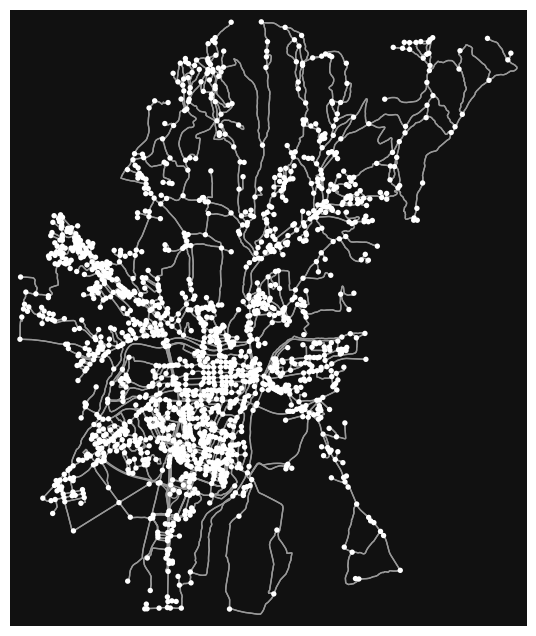

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [49]:
G = ox.consolidate_intersections(G_proj, tolerance=15, rebuild_graph=True, dead_ends=True)
ox.plot_graph(G)

In [51]:
_, sub_e = ox.graph_to_gdfs(G) 

m = folium.Map(location=ox.geocode(city), dragging=False, zoom_control=False, scrollWheelZoom=False,
               zoom_start=14)

folium.GeoJson(sub_e, style_function=lambda x: {'fillColor': '#228B22', 'color': '#228B22'}).add_to(m)

m

In [120]:
nodes, edges = ox.graph_to_gdfs(G)
ex_ed = edges.explode('highway')
cycleways = ex_ed[ex_ed['highway'] == 'cycleway']
paths = ex_ed[ex_ed['highway'] == 'path']
pedestrian = ex_ed[ex_ed['highway'] == 'pedestrian']

m2 = folium.Map(location=ox.geocode(city), dragging=False, zoom_control=True, scrollWheelZoom=False,
               zoom_start=14)

# folium.GeoJson(ex_ed[ex_ed['highway'] == 'unclassified'], style_function=lambda x: {'fillColor': 'red', 'color': 'red'}).add_to(m2)
# folium.GeoJson(ex_ed[ex_ed['highway'] == 'residential'], style_function=lambda x: {'fillColor': 'red', 'color': 'orange'}).add_to(m2)
# folium.GeoJson(ex_ed[ex_ed['highway'] == 'living_street'], style_function=lambda x: {'fillColor': 'red', 'color': 'orange'}).add_to(m2)
# folium.GeoJson(ex_ed[ex_ed['highway'] == 'tertiary'], style_function=lambda x: {'fillColor': 'red', 'color': 'red'}).add_to(m2)
# folium.GeoJson(cycleways, style_function=lambda x: {'fillColor': '#228B22', 'color': '#22228B'}).add_to(m2)
# folium.GeoJson(paths, style_function=lambda x: {'fillColor': '#8B2222', 'color': '#22228B'}).add_to(m2)
# folium.GeoJson(pedestrian, style_function=lambda x: {'fillColor': '#22228B', 'color': '#228B22'}).add_to(m2)

m2

In [53]:
c = nx.betweenness_centrality(G, weight='length') # add weights
c

{0: 0.20725563120260923,
 1: 0.058221914773272425,
 2: 0.20159205475573352,
 3: 0.008424578351732185,
 4: 0.008425920272463585,
 5: 0.03175722506895795,
 6: 0.028496357691654796,
 7: 0.06289548920055743,
 8: 0.070994651774925,
 9: 0.013176319661621269,
 10: 0.021581104682565296,
 11: 0.013985833342838604,
 12: 0.006486173855224198,
 13: 0.0055159651664216545,
 14: 0.023239718706576283,
 15: 0.04953163611672295,
 16: 0.0030481729413761797,
 17: 0.00451522778097975,
 18: 0.0028462138713004083,
 19: 0.006466716004618891,
 20: 0.002447663414074467,
 21: 0.013937188716325337,
 22: 0.015995024157927966,
 23: 0.005768246263924944,
 24: 0.006109765090066365,
 25: 0.03776332678252363,
 26: 0.006175183725722138,
 27: 0.0855065180444726,
 28: 0.024737973203184913,
 29: 0.011557292299186594,
 30: 0.007301390699549987,
 31: 0.0,
 32: 0.15164341677172788,
 33: 0.1082181909432428,
 34: 0.0684577506322124,
 35: 0.060292498461823364,
 36: 0.0156618923363578,
 37: 0.048052503990536774,
 38: 0.0568749618

<Axes: ylabel='Count'>

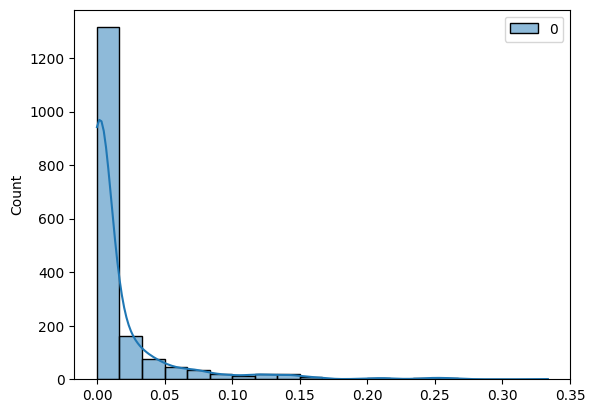

In [60]:
sns.histplot(c.values(), bins=20, kde=True)

OutMultiEdgeView([(0, 209, 0), (0, 100, 0), (0, 12, 0), (0, 2, 0), (1, 16, 0), (1, 735, 0), (1, 14, 0), (1, 15, 0), (2, 0, 0), (2, 11, 0), (2, 380, 0), (3, 4, 0), (4, 321, 0), (4, 67, 0), (5, 6, 0), (5, 7, 0), (5, 1168, 0), (5, 1169, 0), (6, 1164, 0), (6, 5, 0), (6, 1403, 0), (7, 5, 0), (7, 8, 0), (7, 1174, 0), (7, 1573, 0), (8, 7, 0), (8, 461, 0), (8, 1403, 0), (9, 10, 0), (9, 11, 0), (10, 235, 0), (11, 2, 0), (11, 9, 0), (12, 0, 0), (12, 13, 0), (13, 3, 0), (13, 12, 0), (14, 28, 0), (14, 1, 0), (15, 382, 0), (15, 1, 0), (16, 1, 0), (16, 950, 0), (17, 18, 0), (17, 19, 0), (17, 20, 0), (18, 17, 0), (18, 435, 0), (18, 1674, 0), (19, 35, 0), (19, 17, 0), (19, 680, 0), (20, 687, 0), (20, 687, 1), (20, 17, 0), (21, 22, 0), (21, 23, 0), (21, 24, 0), (22, 21, 0), (22, 1092, 0), (22, 1089, 0), (23, 21, 0), (23, 1585, 0), (23, 442, 0), (23, 443, 0), (24, 577, 0), (24, 21, 0), (24, 1685, 0), (25, 26, 0), (25, 27, 0), (25, 28, 0), (25, 29, 0), (26, 1140, 0), (26, 29, 0), (27, 25, 0), (27, 232, 0

In [59]:
pos = nx.spring_layout(G, seed=40)
nx.draw_networkx_nodes(G, pos)

ModuleNotFoundError: No module named 'scipy'

In [104]:
nodes = nx.dijkstra_path(G, 0, 126, weight='weight')
edges = list(nx.utils.pairwise(nodes))

edges

[(0, 209),
 (209, 163),
 (163, 161),
 (161, 304),
 (304, 305),
 (305, 182),
 (182, 181),
 (181, 183),
 (183, 450),
 (450, 447),
 (447, 104),
 (104, 126)]

In [105]:
n, e = ox.graph_to_gdfs(G)

In [111]:
def get_weight_by_highway(series):
    if series['highway'] == 'cycleway':
        return 1
    elif series['highway'] == 'path':
        return 1
    elif series['highway'] == 'pedestrian':
        return 2
    elif series['highway'] == 'unclassified':
        return 4
    elif series['highway'] == 'residential':
        return 4
    elif series['highway'] == 'living_street':
        return 4
    elif series['highway'] == 'tertiary':
        return 6
    elif series['highway'] == 'secondary':
        return 8
    elif series['highway'] == 'primary':
        return 10
    else:
        return 4

In [113]:
e['weight'] = e['length'] / e.apply(get_weight_by_highway, axis=1)
e

osmid  oneway   lanes       highway maxspeed  \
u    v    key                                                                  
0    209  0                 555434693    True       2       primary       50   
     100  0                 101118290    True       1   residential      NaN   
     12   0    [555704780, 485413630]    True       1  primary_link       50   
     2    0    [485413624, 555434694]    True  [2, 3]       primary       50   
1    16   0                 330071849    True       1      tertiary       50   
...                               ...     ...     ...           ...      ...   
1723 673  0                 169322111   False     NaN       service      NaN   
1724 1715 0                1246809101   False     NaN       service      NaN   
1725 1241 0                1285915640   False     NaN       service      NaN   
1726 514  0                1312225801   False     NaN       service      NaN   
1727 1623 0                1316729626   False     NaN       service      NaN   

              reversed      length  \
u    v    key                        
0    209  0      False  222.436589   
     100  0      False   84.944894   
     12   0      False   82.282307   
     2    0      False  341.438284   
1    16   0      False   68.826733   
...                ...         ...   
1723 673  0      False  121.920871   
1724 1715 0       True   78.894522   
1725 1241 0       True   70.118861   
1726 514  0       True   46.236000   
1727 1623 0       True   59.505000   

                                                        geometry  ref  \
u    v    key                                                           
0    209  0    LINESTRING (429324.917 5480983.916, 429344.852...   49   
     100  0    LINESTRING (429324.917 5480983.916, 429327.496...  NaN   
     12   0    LINESTRING (429324.917 5480983.916, 429317.975...  NaN   
     2    0    LINESTRING (429324.917 5480983.916, 429299.601...   49   
1    16   0    LINESTRING (431218.839 5480874.947, 431240.405...  NaN   
...                                                          ...  ...   
1723 673  0    LINESTRING (429758.109 5479732.022, 429768.628...  NaN   
1724 1715 0    LINESTRING (429966.181 5480011.940, 429967.016...  NaN   
1725 1241 0    LINESTRING (427787.834 5482804.116, 427792.937...  NaN   
1726 514  0    LINESTRING (429082.484 5481563.635, 429101.834...  NaN   
1727 1623 0    LINESTRING (429612.446 5479755.980, 429623.462...  NaN   

                            name   u_original   v_original bridge  \
u    v    key                                                       
0    209  0    Aleja Tysiąclecia   3345937987   1167317550    NaN   
     100  0                  NaN   1167316310   1167316397    NaN   
     12   0                  NaN   1841395475    704887241    NaN   
     2    0    Aleja Tysiąclecia   1167320291   1167319506    NaN   
1    16   0    Aleja Tysiąclecia    704888604   3059374656    NaN   
...                          ...          ...          ...    ...   
1723 673  0                  NaN  11591213361  11591213362    NaN   
1724 1715 0                  NaN  11591213366  11591213368    NaN   
1725 1241 0                  NaN  11928170486  11928170484    NaN   
1726 514  0                  NaN  12146065876  12146065871    NaN   
1727 1623 0                  NaN  12186554221  12186554223    NaN   

                     service access width tunnel     weight  
u    v    key                                                
0    209  0              NaN    NaN   NaN    NaN  22.243659  
     100  0              NaN    NaN   NaN    NaN  21.236223  
     12   0              NaN    NaN   NaN    NaN  20.570577  
     2    0              NaN    NaN   NaN    NaN  34.143828  
1    16   0              NaN    NaN   NaN    NaN  11.471122  
...                      ...    ...   ...    ...        ...  
1723 673  0              NaN    NaN   NaN    NaN  30.480218  
1724 1715 0              NaN    NaN   NaN    NaN  19.723631  
1725 1241 0         driveway

In [116]:
e[e.index.isin(edges)]

,,,osmid,oneway,lanes,highway,maxspeed,reversed,length,geometry,ref,name,u_original,v_original,bridge,service,access,width,tunnel,weight
u,v,key,,,,,,,,,,,,,,,,,,


In [117]:
path_G = ox.graph_from_gdfs(n, e[e.index.isin(edges)])

nodes, edges = ox.graph_to_gdfs(path_G)
ex_ed = edges.explode('highway')
cycleways = ex_ed[ex_ed['highway'] == 'cycleway']
paths = ex_ed[ex_ed['highway'] == 'path']
pedestrian = ex_ed[ex_ed['highway'] == 'pedestrian']

m3 = folium.Map(location=ox.geocode(city), dragging=False, zoom_control=True, scrollWheelZoom=False,
               zoom_start=14)

folium.GeoJson(ex_ed[ex_ed['highway'] == 'unclassified'], style_function=lambda x: {'fillColor': 'red', 'color': 'red'}).add_to(m3)
folium.GeoJson(ex_ed[ex_ed['highway'] == 'residential'], style_function=lambda x: {'fillColor': 'red', 'color': 'orange'}).add_to(m3)
folium.GeoJson(ex_ed[ex_ed['highway'] == 'living_street'], style_function=lambda x: {'fillColor': 'red', 'color': 'orange'}).add_to(m3)
folium.GeoJson(ex_ed[ex_ed['highway'] == 'tertiary'], style_function=lambda x: {'fillColor': 'red', 'color': 'red'}).add_to(m3)
folium.GeoJson(cycleways, style_function=lambda x: {'fillColor': '#228B22', 'color': '#22228B'}).add_to(m3)
folium.GeoJson(paths, style_function=lambda x: {'fillColor': '#8B2222', 'color': '#22228B'}).add_to(m3)
folium.GeoJson(pedestrian, style_function=lambda x: {'fillColor': '#22228B', 'color': '#228B22'}).add_to(m3)

m3

ValueError: Graph contains no edges

In [362]:
nx.dijkstra_path(G, 54, 126, weight='weight')

[54,
 609,
 404,
 613,
 379,
 3,
 4,
 0,
 203,
 204,
 617,
 540,
 541,
 831,
 592,
 586,
 179,
 566,
 567,
 564,
 443,
 442,
 444,
 126]

osmid  oneway   lanes       highway maxspeed  \
u    v    key                                                                  
0    209  0                 555434693    True       2       primary       50   
     100  0                 101118290    True       1   residential      NaN   
     12   0    [555704780, 485413630]    True       1  primary_link       50   
     2    0    [485413624, 555434694]    True  [2, 3]       primary       50   
1    16   0                 330071849    True       1      tertiary       50   
...                               ...     ...     ...           ...      ...   
1723 673  0                 169322111   False     NaN       service      NaN   
1724 1715 0                1246809101   False     NaN       service      NaN   
1725 1241 0                1285915640   False     NaN       service      NaN   
1726 514  0                1312225801   False     NaN       service      NaN   
1727 1623 0                1316729626   False     NaN       service      NaN   

              reversed      length  \
u    v    key                        
0    209  0      False  222.436589   
     100  0      False   84.944894   
     12   0      False   82.282307   
     2    0      False  341.438284   
1    16   0      False   68.826733   
...                ...         ...   
1723 673  0      False  121.920871   
1724 1715 0       True   78.894522   
1725 1241 0       True   70.118861   
1726 514  0       True   46.236000   
1727 1623 0       True   59.505000   

                                                        geometry  ref  \
u    v    key                                                           
0    209  0    LINESTRING (429324.917 5480983.916, 429344.852...   49   
     100  0    LINESTRING (429324.917 5480983.916, 429327.496...  NaN   
     12   0    LINESTRING (429324.917 5480983.916, 429317.975...  NaN   
     2    0    LINESTRING (429324.917 5480983.916, 429299.601...   49   
1    16   0    LINESTRING (431218.839 5480874.947, 431240.405...  NaN   
...                                                          ...  ...   
1723 673  0    LINESTRING (429758.109 5479732.022, 429768.628...  NaN   
1724 1715 0    LINESTRING (429966.181 5480011.940, 429967.016...  NaN   
1725 1241 0    LINESTRING (427787.834 5482804.116, 427792.937...  NaN   
1726 514  0    LINESTRING (429082.484 5481563.635, 429101.834...  NaN   
1727 1623 0    LINESTRING (429612.446 5479755.980, 429623.462...  NaN   

                            name   u_original   v_original bridge  \
u    v    key                                                       
0    209  0    Aleja Tysiąclecia   3345937987   1167317550    NaN   
     100  0                  NaN   1167316310   1167316397    NaN   
     12   0                  NaN   1841395475    704887241    NaN   
     2    0    Aleja Tysiąclecia   1167320291   1167319506    NaN   
1    16   0    Aleja Tysiąclecia    704888604   3059374656    NaN   
...                          ...          ...          ...    ...   
1723 673  0                  NaN  11591213361  11591213362    NaN   
1724 1715 0                  NaN  11591213366  11591213368    NaN   
1725 1241 0                  NaN  11928170486  11928170484    NaN   
1726 514  0                  NaN  12146065876  12146065871    NaN   
1727 1623 0                  NaN  12186554221  12186554223    NaN   

                     service access width tunnel  
u    v    key                                     
0    209  0              NaN    NaN   NaN    NaN  
     100  0              NaN    NaN   NaN    NaN  
     12   0              NaN    NaN   NaN    NaN  
     2    0              NaN    NaN   NaN    NaN  
1    16   0              NaN    NaN   NaN    NaN  
...                      ...    ...   ...    ...  
1723 673  0              NaN    NaN   NaN    NaN  
1724 1715 0              NaN    NaN   NaN    NaN  
1725 1241 0         driveway    NaN   NaN    NaN  
1726 514  0              NaN    NaN   NaN    NaN  
1727 1623 0    parking_aisle    NaN 

In [81]:
nodes_x, edges_x = ox.graph_to_gdfs(x)

In [86]:
nodes_x

,y,x,highway,street_count,lon,lat,ref,geometry
osmid,,,,,,,,
242911349,5.480956e+06,429330.660610,crossing,3,20.024454,49.477131,NaN,POINT (429330.661 5480955.717)
2320111914,5.480975e+06,429329.528746,NaN,4,20.024435,49.477301,NaN,POINT (429329.529 5480974.623)
3345937987,5.480975e+06,429344.851941,crossing,3,20.024646,49.477308,NaN,POINT (429344.852 5480975.159)
242911481,5.480861e+06,431239.085687,NaN,3,20.050811,49.476500,NaN,POINT (431239.086 5480861.176)
704888604,5.480871e+06,431240.405285,NaN,3,20.050827,49.476589,NaN,POINT (431240.405 5480871.033)
...,...,...,...,...,...,...,...,...
11928170482,5.482869e+06,427821.478255,NaN,1,20.003274,49.494164,NaN,POINT (427821.478 5482869.407)
11928170486,5.482804e+06,427787.833634,NaN,1,20.002822,49.493573,NaN,POINT (427787.834 5482804.116)
12146065876,5.481564e+06,429082.484298,NaN,1,20.020919,49.482569,NaN,POINT (429082.484 5481563.635)


In [346]:
edges[edges['name'] == 'Kolejowa']

osmid  oneway lanes      highway maxspeed  \
u    v    key                                                               
410  260  0                 582343048   False     2    secondary       50   
153  152  0                 317287748   False   NaN  residential       50   
260  55   0                 582343048   False     2    secondary       50   
     410  0                 582343048   False     2    secondary       50   
152  63   0                 317287748   False   NaN  residential       50   
     153  0                 317287748   False   NaN  residential       50   
55   260  0                 582343048   False     2    secondary       50   
     53   0                 101118294   False     2  residential       50   
63   152  0                 317287748   False   NaN  residential       50   
112  113  0                 363292667   False   NaN  residential       50   
113  201  0                 101118110    True   NaN  residential       50   
     112  0                 363292667   False   NaN  residential       50   
201  131  0    [101118014, 101118110]    True   NaN  residential       50   
131  133  0                 253629266    True   NaN  residential       50   
53   54   0                 101118294   False     2  residential       50   
     55   0                 101118294   False     2  residential       50   
54   53   0                 101118294   False     2  residential       50   
     1035 0                 101118294   False     2  residential       50   
1035 1034 0    [242754581, 101118294]   False     2      service       50   
     54   0                 101118294   False     2  residential       50   
1034 1035 0    [242754581, 101118294]   False     2      service       50   

                    reversed      length  \
u    v    key                              
410  260  0             True   76.476000   
153  152  0            False  187.666358   
260  55   0             True  137.633604   
     410  0            False   76.476000   
152  63   0            False  111.757000   
     153  0             True  187.666358   
55   260  0            False  137.633604   
     53   0            False  176.421765   
63   152  0             True  111.757000   
112  113  0             True  118.459000   
113  201  0            False  186.138824   
     112  0            False  118.459000   
201  131  0            False   87.655258   
131  133  0            False   88.717777   
53   54   0            False  100.751000   
     55   0             True  176.421765   
54   53   0             True  100.751000   
     1035 0            False   45.075000   
1035 1034 0    [False, True]   50.536000   
     54   0             True   45.075000   
1034 1035 0    [False, True]   50.536000   

                                                        geometry  ref  \
u    v    key                                                           
410  260  0    LINESTRING (428720.239 5480975.183, 428682.514...  957   
153  152  0    LINESTRING (428860.400 5481102.870, 428864.134...  NaN   
260  55   0    LINESTRING (428663.325 5480923.978, 428565.828...  957   
     410  0    LINESTRING (428663.325 5480923.978, 428682.514...  957   
152  63   0    LINESTRING (428988.194 5481238.627, 429070.153...  NaN   
     153  0    LINESTRING (428988.194 5481238.627, 428872.443...  NaN   
55   260  0    LINESTRING (428563.793 5480828.927, 428565.828...  957   
     53   0    LINESTRING (428563.793 5480828.927, 428565.828...  NaN   
63   152  0    LINESTRING (429070.153 5481314.828, 428988.194...  NaN   
112  113  0    LINESTRING (429291.055 5481405.196, 429303.092...  NaN   
113  201  0    LINESTRING (429402.233 5481446.854, 429470.718...  NaN   
     112  0    LINESTRING (429402.233 5481446.854, 429392.932...  NaN   
201  131  0    LINESTRING (429580.736 5481445.516, 429588.508...  NaN   
131  133  0    LINESTRING (429665.376 5481436.764, 429672.086...  NaN   
53   54   0    LINESTRING (428641.372 5480675.041, 428686.567...  NaN   
     5

In [349]:
nodes

,osmid_original,x,y,street_count,lon,lat,highway,geometry
osmid,,,,,,,,
0,"[242911349, 2320111914, 3345937987, 1167316833...",429326.131656,5.480977e+06,0,NaN,NaN,NaN,POINT (429326.132 5480977.220)
203,"[1167317550, 1167319653]",429540.433663,5.480987e+06,0,NaN,NaN,NaN,POINT (429540.434 5480987.419)
16,704887241,429319.803050,5.480904e+06,3,20.024313,49.476664,NaN,POINT (429319.803 5480903.898)
3,"[3853829751, 1167317025, 1167319506]",429003.556116,5.480984e+06,0,NaN,NaN,NaN,POINT (429003.556 5480983.762)
102,1167316310,429327.496475,5.481008e+06,3,20.024400,49.477605,crossing,POINT (429327.496 5481008.485)
...,...,...,...,...,...,...,...,...
1334,11928148635,427717.129173,5.482748e+06,3,20.001856,49.493063,NaN,POINT (427717.129 5482748.333)
1342,11928148637,427737.664622,5.482733e+06,3,20.002142,49.492929,NaN,POINT (427737.665 5482733.161)
1177,3446752385,429062.588888,5.480105e+06,3,20.020906,49.469450,NaN,POINT (429062.589 5480105.183)


In [354]:
lat = 49.473691
lon = 20.015459

## get_closest_node

nodes['distance'] = np.sqrt(np.square(nodes['lon'].fillna(0) - lon) + np.square(nodes['lat'].fillna(0) - lat)) 

In [364]:
nodes['distance'].idxmin()

54

In [361]:
nodes

,osmid_original,x,y,street_count,lon,lat,highway,geometry,distance
osmid,,,,,,,,,
0,"[242911349, 2320111914, 3345937987, 1167316833...",429326.131656,5.480977e+06,0,NaN,NaN,NaN,POINT (429326.132 5480977.220),53.369136
203,"[1167317550, 1167319653]",429540.433663,5.480987e+06,0,NaN,NaN,NaN,POINT (429540.434 5480987.419),53.369136
16,704887241,429319.803050,5.480904e+06,3,20.024313,49.476664,NaN,POINT (429319.803 5480903.898),0.009340
3,"[3853829751, 1167317025, 1167319506]",429003.556116,5.480984e+06,0,NaN,NaN,NaN,POINT (429003.556 5480983.762),53.369136
102,1167316310,429327.496475,5.481008e+06,3,20.024400,49.477605,crossing,POINT (429327.496 5481008.485),0.009761
...,...,...,...,...,...,...,...,...,...
1334,11928148635,427717.129173,5.482748e+06,3,20.001856,49.493063,NaN,POINT (427717.129 5482748.333),0.023671
1342,11928148637,427737.664622,5.482733e+06,3,20.002142,49.492929,NaN,POINT (427737.665 5482733.161),0.023397
1177,3446752385,429062.588888,5.480105e+06,3,20.020906,49.469450,NaN,POINT (429062.589 5480105.183),0.006903
